# EDA

## 📊 Executive Summary: What You Will See in This Notebook

In this exploratory data analysis (EDA) of the remote job market, we examine deep patterns in salary distributions, sector demands, and geographic influences. The key insights that will be demonstrated through the subsequent charts and data include:

### 1. Seniority Level and Employment Type
* **Upward Salary Trend:** Median salaries scale logically from intern to executive levels. However, the largest variance and massive financial outliers (reaching up to nearly $1M) are concentrated in Senior and Executive tiers.
* **Full-Time Dominance:** Full-time contracts overwhelmingly command the highest median and maximum salary ceilings compared to part-time or project-based roles.

### 2. Geography, Location Restrictions, and Language
* **North American Leadership:** Roles based in North America—specifically US-Only restrictions—hold the highest income tier across the entire market.
* **Variable Correlation:** The correlation heatmap demonstrates an extremely strong correlation (0.98) between the geographic "Region" and "Location Restrictions", alongside significant dependency between location rules and paid currencies (predominantly USD).
* **Language Hegemony:** English (en) remains the undisputed primary language of the remote job market, exclusively securing the top-paying listings.

### 3. Industry Categories, Demand, and Salary Premiums
* **Demand vs. Compensation:** While Sales, Software Development, and Healthcare drive the highest volume of listings, Product Management, Cloud Engineering, and Enterprise Sales achieve the highest median salaries.
* **Tech Sector Premiums:** Niches such as Cybersecurity, Data/AI/ML, and Cloud/DevOps capture massive salary premiums despite exhibiting lower-than-average demand volume.
* **The Radiology Outlier:** The scatter plot reveals a striking anomaly: Radiology appears on the left side of the X-axis (indicating lower-than-average market demand) while sitting high above 400k on the Y-axis, representing an elite specialty with massive fiscal value for few positions.

### 4. Temporal Market Patterns
* **Hiring Peaks:** Thursdays experience a massive surge in job posting activity, peaking at over 160k posts. Conversely, weekend days (especially Sundays) record the lowest operational volume.

---

In [1]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


df = pd.read_csv('../3_data/cleaned.csv')
df.head(5)
df = df.drop(columns='Unnamed: 0')
df.drop(columns='Timezone Restrictions', inplace=True)
df_category_exp = df.copy() # for the category exp at the end
df.head(2)

,Title,Company Name,Company Slug,seniority,Employment Type,Parent Categories,Category,Location Restrictions,Min Salary,Max Salary,...,Min_Salary_USD_Annual,Max_Salary_USD_Annual,Avg_Salary_USD_Annual,Language,Director,Entry-level,Executive,Manager,Mid-level,Senior
0,Senior Security Researcher,CommIT,commit,Senior,Full Time,NaN,"Security-Researcher, Cybersecurity-Researcher,...",Ukraine,NaN,NaN,...,NaN,NaN,NaN,en,0,0,0,0,0,1
1,"Director, Revenue Cycle Management",SimpliFed,simplifed,Director,Full Time,NaN,"Revenue-Cycle-Management, Healthcare-Billing, ...",United States,140000.0,140000.0,...,140000.0,140000.0,140000.0,en,1,0,0,0,0,0


## 1- Data Health Check


In [2]:
df_no_contractors = df[df['Employment Type'] != 'Contractor']
salary_stats = (df_no_contractors.groupby('Standard Category')['Avg_Salary_USD_Annual'].agg(['min' , 'max' ,'mean', 'median' , 'count']))
salary_stats['mean-median'] = (salary_stats['mean'] - salary_stats['median']).abs()
salary_stats =  salary_stats.sort_values(by='mean-median' , ascending=False)
salary_stats.style.format(lambda x: f'{x/1000:.1f}k',subset=['min' , 'max' ,'mean', 'median', 'mean-median'])

,min,max,mean,median,count,mean-median
Standard Category,,,,,,
Healthcare,7.8k,875.0k,156.5k,110.0k,2305,46.5k
Design & Creative,9.2k,585.0k,124.3k,111.2k,237,13.1k
Education,1.3k,227.5k,82.1k,69.2k,198,12.8k
Sales,1.6k,525.0k,132.7k,121.1k,2610,11.5k
Customer Service,1.3k,300.0k,85.7k,74.9k,1056,10.9k
Finance & Accounting,1.2k,600.0k,118.0k,107.5k,881,10.5k
Engineering,1.4k,699.5k,151.2k,142.5k,1199,8.7k
Data & AI,4.5k,825.0k,151.7k,143.1k,1104,8.6k
Writing & Content,6.0k,225.0k,83.3k,75.1k,258,8.2k


#### 1-1: Structure exploration

In [3]:
df.drop(columns=['Published Date', 'Expiry Date' , 'Min Salary' , 'Max Salary'], inplace=True)
# these columns droped Duo to Standazations done before
df.info()

<class 'pandas.DataFrame'>
RangeIndex: 43828 entries, 0 to 43827
Data columns (total 28 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Title                  43828 non-null  str    
 1   Company Name           43828 non-null  str    
 2   Company Slug           43828 non-null  str    
 3   seniority              43828 non-null  str    
 4   Employment Type        43828 non-null  str    
 5   Parent Categories      25421 non-null  str    
 6   Category               43816 non-null  str    
 7   Location Restrictions  43828 non-null  str    
 8   Salary Period          43828 non-null  str    
 9   Currency               23802 non-null  str    
 10  Published Date(STD)    43828 non-null  str    
 11  Expiry Date(STD)       43828 non-null  str    
 12  Application Link       43828 non-null  str    
 13  Excerpt                43828 non-null  str    
 14  GUID                   43828 non-null  str    
 15  Standard Cate

#### 1-2 Mnaging outliers and Mean validation for further analyses:

In [4]:
df_dummies_ET = df['Employment Type'].str.get_dummies(", ")
df = pd.concat([df, df_dummies_ET], axis=1)

describe_stats =  df.describe()
describe_stats.style.format(lambda x: f'{x/1000:.1f}k',subset=['Min_Salary_USD_Annual' , 'Max_Salary_USD_Annual' ,'Avg_Salary_USD_Annual'])

,Min_Salary_USD_Annual,Max_Salary_USD_Annual,Avg_Salary_USD_Annual,Director,Entry-level,Executive,Manager,Mid-level,Senior,Contractor,Full Time,Intern,Other,Part Time,Temporary,Volunteer
count,16.2k,16.2k,16.2k,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000,43828.000000
mean,111.2k,153.7k,132.4k,0.068130,0.113900,0.032011,0.128343,0.347654,0.372753,0.108059,0.842521,0.009857,0.007621,0.024573,0.005271,0.002099
std,70.2k,101.5k,83.8k,0.251972,0.317693,0.176033,0.334475,0.476231,0.483543,0.310458,0.364256,0.098792,0.086964,0.154823,0.072408,0.045769
min,0.0k,1.0k,0.9k,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,67.0k,86.6k,77.5k,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,100.0k,140.0k,121.8k,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,140.0k,194.1k,168.5k,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1040.0k,1500.0k,1040.0k,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Impact of Removing Contractor Positions
* **Higher Median Pay:** Filtering out contractors increased both the mean salary (from $132.4k to $134.3k) and median salary (from $121.8k to $123.6k).
* **Reduced Variance:** Standard deviation dropped from $83.8k to $82.6k, reducing right-tail noise and extreme salary outliers.
* **Cleaner Full-Time Baseline:** This step stabilizes the dataset, providing a more reliable foundation for standard full-time compensation analysis.
##### ####################################################################################

In [5]:

# ۱. ساخت نمودار
fig2 = px.histogram(
    df, 
    x="Max_Salary_USD_Annual", 
    nbins=50, 
    color='Contractor', 
    #template='plotly_dark',
    title='Maximum Annual Average salary Distribution',
    labels={'Avg_Salary_USD_Annual': 'Average Annual Salary'}
)

# ۲. اضافه کردن Subtitle و تنظیم عنوان
fig2.update_layout(
    title=dict(
        text='Maximum Annual Average salary Distribution',
        font=dict(color='White', size=17),
        subtitle=dict(
            text='How contracor positions distribute and increase max values in dataset:',
            font=dict(color='gray', size=11)
        )
    )
)

# ۳. اضافه کردن Annotation بالای ستون 1M
fig2.add_annotation(
    x=1000000,           # موقعیت روی محور افقی (1M)
    y=50,                # ارتفاع فلش روی محور عمودی (بستگی به دید بهتر دارد)
    text="Contractor",   # متنی که می‌خواهید نمایش داده شود
    showarrow=True,      # نمایش فلش
    arrowhead=2,         # استایل سر فلش
    arrowcolor="orange", # رنگ فلش
    arrowsize=1,
    ax=0,                # جابه‌جایی افقی متن نسبت به اشاره‌گر
    ay=-40,              # جابه‌جایی عمودی متن (منفی یعنی بالای فلش)
    font=dict(size=13, color="orange", family="Arial Black")
)

fig2.show()

## 2: Exploring Varibles
### 2-1: Univariate Analysis


In [6]:
df_sen_exp = df.assign(
    seniority=df["seniority"].str.split(", ")
).explode("seniority")
df_sen_exp_stats = (df_sen_exp.groupby('seniority')['Avg_Salary_USD_Annual'].agg(['count', 'mean', 'median'])).reset_index()
df_sen_exp_stats

,seniority,count,mean,median
0,Director,1680,193104.043587,190000.0
1,Entry-level,1078,57823.171639,51225.0
2,Executive,610,215786.884555,207025.0
3,Manager,2440,127739.228083,125000.0
4,Mid-level,4846,98168.718338,80232.5
5,Senior,6764,151554.825981,140000.0


In [7]:
df_emp_stats = (df.groupby('Employment Type')['Avg_Salary_USD_Annual'].agg(['count', 'mean', 'median'])).reset_index()
df_emp_stats

,Employment Type,count,mean,median
0,Contractor,726,91805.530035,62400.00000
1,Full Time,14990,135555.638113,125000.00000
2,Intern,49,54531.721994,47448.82688
3,Other,165,121244.684388,120000.00000
4,Part Time,221,91049.516460,55120.00000
5,Temporary,56,90960.229199,63000.00000
6,Volunteer,0,NaN,NaN


In [8]:
# ۱. ساخت نمودارهای px اولیه
fig_pie1 = px.pie(df_sen_exp_stats,values="count",names="seniority",template="plotly_dark",
    title="Annual Average Salary Distribution by Seniority (Exploded)",hole=0.4,hover_name='seniority')

fig_pie2 = px.pie(df_emp_stats, values='count' , names='Employment Type', template='plotly_dark',
                  title='Annual Average salary Distribution', hole=0.4,hover_name='Employment Type')

# ۲. تعریف شبکه با مشخص کردن نوع (type) هر خانه در specs
fig_combined = make_subplots(
    rows=1,
    cols=2,
    specs=[
        [{"type": "domain"}, {"type": "domain"}]                               #"xy"(def):Bar, Scatter, Box, Histogram, Line
    ],  # خانه (1,1) برای Pie و خانه (1,2) برای Bar                          "domain" : Pie, Donut, Sunburst, Treemap
    subplot_titles=("Seniority Postings Count", "Employment Types Postings Count"),       # "scene" : 3d
)                                                                               #  and 'polar'

# ۳. انتقال Traceها به بوم ترکیبی
for trace in fig_pie1.data:
    fig_combined.add_trace(trace, row=1, col=1)

for trace in fig_pie2.data:
    fig_combined.add_trace(trace, row=1, col=2)


fig_combined.update_traces( textinfo='label',rotation=300)
fig_combined.update_layout(template="plotly_dark", height=500,
                           uniformtext_minsize=12, uniformtext_mode='hide')
fig_combined.show()

In [9]:
df_grouped = (
    df.groupby('Employment Type')['Max_Salary_USD_Annual']
    .max()  # یا .sum() یا .count() بسته به نیاز شما
    .reset_index()
)

# ۲. رسم نمودار با دیتافریم جدید و سبک
fig3_3 = px.bar(
    df_grouped,
    x='Max_Salary_USD_Annual',
    y='Employment Type',
    template='plotly_dark',
    title='Max salarries paid'
)

fig3_3.show()

* **Contractor positions were excluded** because they do not reflect standard full-time compensation and only distort the overall salary averages.

In [10]:
df_w_contractor = df
df = df[df['Contractor']==0]
df.drop(columns='Contractor', inplace=True)

In [11]:

# ۱. تجمیع داده‌ها (محاسبه هم‌زمان تعداد و میانگین حقوق)
cat_summary = (
    df.groupby("Standard Category")
    .agg(
        job_count=("Avg_Salary_USD_Annual", "count"),
        avg_salary=("Avg_Salary_USD_Annual", "mean"),
    )
    .reset_index()
    .sort_values(by="job_count", ascending=True)  # مرتب‌سازی بر اساس تعداد
)

# ۲. ساخت دو ساب‌پلات کنار هم با محور Y مشترک
fig5 = make_subplots(
    rows=1,
    cols=2,
    subplot_titles=("Job Count per Category", "Average Salary ($) per Category"),
    shared_yaxes=True,  # محور Y مشترک برای جلوگیری از تکرار نام دسته‌ها
)

# نمودار سمت چپ: تعداد آگهی‌ها
fig5.add_trace(
    go.Bar(
        x=cat_summary["job_count"],
        y=cat_summary["Standard Category"],
        orientation="h",
        name="Job Count",
        marker_color="#636EFA",
        text=cat_summary["job_count"],  # نمایش عدد روی میله
        textposition="auto",
    ),
    row=1,
    col=1,
)

# نمودار سمت راست: میانگین حقوق
fig5.add_trace(
    go.Bar(
        x=cat_summary["avg_salary"],
        y=cat_summary["Standard Category"],
        orientation="h",
        name="Avg Salary",
        marker_color="#00CC96",
        text=cat_summary["avg_salary"].apply(
            lambda x: f"${x/1000:.1f}k"
        ),  # فرمت فرمولی حقوق به k$
        textposition="auto",
    ),
    row=1,
    col=2,
)

# ۳. تنظیمات ظاهری
fig5.update_layout(
    template="plotly_dark",
    title_text="Job Market Overview: Demand vs. Compensation (without contractors opportunity)",
    showlegend=False,
    height=700,
)

fig5.show()

In [12]:

# ۱. تجمیع داده‌ها: محاسبه مجموع حقوق برای هر (دسته‌بندی + شرکت)
df_company_budget = (
    df.groupby(['Standard Category', 'Company Slug'])['Avg_Salary_USD_Annual']
    .sum()
    .reset_index()
)

# ۲. جدا کردن فقط ۲۰ شرکت برتر بر اساس بیشترین مجموع بودجه حقوق
top30_companies = df_company_budget.nlargest(30, 'Avg_Salary_USD_Annual')

# ۳. رسم Treemap خلوت، خوانا و تفکیک‌شده
fig7 = px.treemap(
    top30_companies,
    path=[
        'Standard Category',
        'Company Slug',
    ],  # ابتدا دسته اصلی، سپس شرکت‌های زیرمجموعه
    values='Avg_Salary_USD_Annual',
    color='Avg_Salary_USD_Annual',
    color_continuous_scale='Plasma',  # پالت رنگی شفاف‌تر برای کنتراست بهتر
    template='plotly_dark',
    title='Top 30 Companies by Total Salary Budget Across Categories',
)

# تنظیم فرمت متون برای خوانایی کامل
fig7.update_traces(textinfo='label+value')
fig7.update_layout(margin=dict(t=50, l=25, r=25, b=25))

fig7.show()

In [13]:

# محاسبه مجموع بودجه حقوق هر شرکت
# فرض می‌کنیم ستون نام شرکت CompanyName یا Company است (نام دقیق را جایگذاری کن)
company_col = 'Company Slug' # نام ستون شرکت‌ها در دیتاست خودت را اینجا بنویس

company_budgets = (
    df.groupby(company_col)['Avg_Salary_USD_Annual']
    .sum()
    .sort_values(ascending=False)
    .reset_index()
)

# محاسبه درصد تجمعی (Cumulative Percentage)
total_market_budget = company_budgets['Avg_Salary_USD_Annual'].sum()
company_budgets['Cumulative_Percentage'] = (company_budgets['Avg_Salary_USD_Annual'].cumsum() / total_market_budget) * 100

# فقط 40 شرکت اول را برای خوانایی نمودار انتخاب می‌کنیم
top_companies = company_budgets.head(40)

fig17 = go.Figure()

# میله‌ها: بودجه هر شرکت
fig17.add_trace(go.Bar(
    x=top_companies[company_col], 
    y=top_companies['Avg_Salary_USD_Annual'], 
    name='Total Budget (USD)',
    marker_color='rgb(55, 83, 109)'
))

# خط: درصد تجمعی
fig17.add_trace(go.Scatter(
    x=top_companies[company_col], 
    y=top_companies['Cumulative_Percentage'], 
    name='Cumulative % of Total Market Budget', 
    yaxis='y2', 
    mode='lines+markers',
    marker=dict(color='rgb(26, 118, 255)')
))

# تنظیم دو محور Y (یکی برای دلار، یکی برای درصد)
fig17.update_layout(
    title='Top 40 Companies by Total Salary Budget (Pareto Analysis)',
    template='plotly_dark' ,
    yaxis=dict(title='Total Budget (USD)'),
    yaxis2=dict(
        title='Cumulative % of Entire Market', 
        overlaying='y', 
        side='right', 
        range=[0, top_companies['Cumulative_Percentage'].max() + 5]
    ),
    xaxis_tickangle=-45,
    height=600,
    legend=dict(x=0.11, y=0.99, bgcolor='rgba(255, 255, 255, 0)')
)

fig17.show()

In [14]:
df_loc_exp = df.copy()
df_loc_exp['Location Restrictions'] = df_loc_exp['Location Restrictions'].str.split(', ')
df_loc_exp = df_loc_exp.explode('Location Restrictions')

In [15]:
df_loc_exp_grouped = (df_loc_exp.groupby(['Region', 'Location Restrictions'])
['Avg_Salary_USD_Annual'].count()).reset_index()
df_loc_exp_grouped=df_loc_exp_grouped.nlargest(20, 'Avg_Salary_USD_Annual')
df_loc_exp_grouped


,Region,Location Restrictions,Avg_Salary_USD_Annual
642,North America,United States,12798
442,North America,Canada,1189
641,North America,United Kingdom,258
314,Europe / EU,United Kingdom,248
414,North America,Australia,189
188,Europe / EU,Germany,173
505,North America,India,141
485,North America,Germany,132
262,Europe / EU,Poland,128
833,Worldwide / Unrestricted,Worldwide / Unrestricted,122


In [16]:
fig8 = px.bar(df_loc_exp_grouped,
              x='Region',y='Avg_Salary_USD_Annual', title='20 most demanded countries for remote jobs',
              color='Location Restrictions' ,template='plotly_dark', labels={'Avg_Salary_USD_Annual':'Count'})
fig8.update_yaxes(type="log")
fig8.show()

In [17]:
# ایجاد یک ستون ساده‌شده برای نوع محدودیت جغرافیایی
# فرض می‌کنیم ستون Location در دیتاست شما وجود دارد
def categorize_location(loc):
    loc = str(loc).lower()
    if 'worldwide' in loc or 'anywhere' in loc:
        return 'Worldwide / No Restriction'
    elif 'us' in loc or 'united states' in loc:
        return 'US-Only'
    elif 'europe' in loc or 'emea' in loc or 'uk' in loc:
        return 'Europe / EMEA'
    else:
        return 'Other / Specific Region'

df['Geo_Restriction'] = df['Location Restrictions'].apply(categorize_location)

# رسم Boxplot برای مقایسه توزیع حقوق
fig2 = px.box(
    df, 
    x='Geo_Restriction', 
    y='Avg_Salary_USD_Annual', 
    color='Geo_Restriction',
    title='Salary Geo-Arbitrage: The Cost of Geographical Restrictions',
    labels={'Geo_Restriction': 'Remote Work Boundary', 'Avg_Salary_USD_Annual': 'Annual Salary (USD)'},
    category_orders={"Geo_Restriction": ["US-Only", "Worldwide / No Restriction", "Europe / EMEA", "Other / Specific Region"]},
    template='plotly_dark'
)

fig2.update_layout(height=500, showlegend=False)
fig2.show()

In [18]:
df_curr_grouped = df.groupby('Currency')['Title'].count().reset_index()
df_curr_grouped_top10 = df_curr_grouped.nlargest(10, 'Title')
fig9 = px.bar(df_curr_grouped_top10,y='Currency',x='Title', title='Currency',
              labels={'Title':'Count'},template='plotly_dark')
fig9.update_xaxes(type='log')
fig9.show()

In [19]:
df['Published Date(STD)'] = pd.to_datetime(df['Published Date(STD)'])

df_day_grouped = df.groupby(df['Published Date(STD)'].dt.day_name())['Avg_Salary_USD_Annual'].mean().reset_index()
df_day_grouped = df_day_grouped.groupby('Published Date(STD)')['Avg_Salary_USD_Annual'].mean().reset_index()
df_day_grouped

,Published Date(STD),Avg_Salary_USD_Annual
0,Friday,144986.605073
1,Monday,129293.205822
2,Saturday,127332.023640
3,Sunday,122765.245188
4,Thursday,161881.807836
5,Tuesday,129568.217554
6,Wednesday,128756.717577


In [20]:
fig9 = px.line(df_day_grouped,x='Published Date(STD)',y='Avg_Salary_USD_Annual', title='Average job postings per day',template='plotly_dark',
              labels={'Published Date(STD)':'Day','Avg_Salary_USD_Annual':'Avg number of published jobs'})
fig9.show()

In [21]:
df_lan_groupped = df.groupby('Language')['Title'].count().reset_index()
df_lan_groupped.nlargest(10, 'Title')

,Language,Title
8,en,36731
22,pt,863
6,de,539
9,es,365
12,fr,300
31,uk,75
21,pl,49
33,zh-cn,31
19,nl,24
16,it,20


In [22]:
fig10 = px.bar(df_lan_groupped.nlargest(10, 'Title'),x='Title',y='Language', title='Top 10 Languages on Remote Jobs',template='plotly_dark',
              labels={'Title':'Count'})
fig10.update_xaxes(type='log')
fig10.show()

### 2-2 Multivariate Analysis:


#### 2-2-1 Spearman Correlation math for the Ratings and categories:

In [23]:
#Luke Barousse:
#df_notna = df.dropna(subset='Min Salary',axis=0) #saved for later  (df.notna())
df_no_contractors = df[df['Employment Type'] != 'Contractor']
salary_stats = (df_no_contractors.groupby('Standard Category')['Avg_Salary_USD_Annual'].agg(['min' , 'max' ,'mean', 'median' , 'count']))
salary_stats['mean-median'] = (salary_stats['mean'] - salary_stats['median']).abs()
salary_stats =  salary_stats.sort_values(by='mean-median' , ascending=False)
salary_stats.style.format(lambda x: f'{x/1000:.1f}k',subset=['min' , 'max' ,'mean', 'median', 'mean-median'])

,min,max,mean,median,count,mean-median
Standard Category,,,,,,
Healthcare,7.8k,875.0k,156.5k,110.0k,2305,46.5k
Design & Creative,9.2k,585.0k,124.3k,111.2k,237,13.1k
Education,1.3k,227.5k,82.1k,69.2k,198,12.8k
Sales,1.6k,525.0k,132.7k,121.1k,2610,11.5k
Customer Service,1.3k,300.0k,85.7k,74.9k,1056,10.9k
Finance & Accounting,1.2k,600.0k,118.0k,107.5k,881,10.5k
Engineering,1.4k,699.5k,151.2k,142.5k,1199,8.7k
Data & AI,4.5k,825.0k,151.7k,143.1k,1104,8.6k
Writing & Content,6.0k,225.0k,83.3k,75.1k,258,8.2k


##### conclusion:
###### A high gap between mean and median in Healthcare shows right-skewness due to high salary outliers.
###### Median is safer than mean for salary analysis here because it is not affected by extreme values.
###### Small sample size in Finance (only 21 rows) makes its overall statistical trends unreliable.
###### Having 86 rows in the 'Other' category highlights the need to improve the category mapping logic.
validations are done in data_cleaning.ipynb notebook...

In [24]:
# ۱. محاسبه ترتیب دسته‌ها بر اساس اختلاف میانگین و میانه (نزولی)
category_stats = df_no_contractors.groupby('Standard Category')['Avg_Salary_USD_Annual'].agg(['mean', 'median'])

sorted_categories = category_stats.sort_values(by='median', ascending=False).index.tolist()

medians3 = (
    df_no_contractors.groupby('Standard Category')['Avg_Salary_USD_Annual']
    .median()
    .reindex(sorted_categories)
    .reset_index()
)

# ۲. رسم Box Plot با ترتیب جدید
fig13 = px.box(
    df_no_contractors,
    y='Standard Category',
    x='Avg_Salary_USD_Annual',
    category_orders={'Standard Category': sorted_categories},
    color='Standard Category',
    title='Annual Average salary Distribution, Sorted by Median',
    labels={ 'Avg_Salary_USD_Annual': 'Average Annual Salary ($)'},
    points='outliers'
)

# ۳. نمایش میانگین به صورت خط‌چین داخل هر باکس
fig13.update_traces(boxmean=True) # برای نمایش میانگین + انحراف معیار می‌توانید از 'sd' استفاده کنید

# ۴. تنظیمات ظاهری
fig13.update_layout(
    showlegend=False,
    height=750,
    template='plotly_dark'
)

fig13.add_trace(
    go.Scatter(
            y=medians3['Standard Category'],
            x=medians3['Avg_Salary_USD_Annual'],
            mode='lines+markers',
            name='Median Trend',
            line=dict(color='white', width=3),
            marker=dict(size=8, color='white'),
        )
)
fig13.show()

# Calculate skewness (|Mean - Median|) to sort categories by degree of distribution asymmetry
# Enable boxmean=True to visually overlay mean (dashed line) against median (solid line)


### Key Insights: Salary Distribution Across Standard Categories (Sorted by Median)

* **Top-Paying Domains:** Specialized technical and strategy roles—specifically **Product**, **Legal**, **Research & Science**, **Data & AI**, and **Software Development**—lead the market with the highest median annual salaries.
* **Healthcare Anomaly (Heavy Right-Skewness):** While **Healthcare** displays a relatively low median salary, it contains the most extreme high-paying outliers in the entire dataset, indicating a vast compensation gap between entry-level/support roles and highly specialized positions.
* **High Salary Variance:** Categories like **Legal** and **Engineering** exhibit wider Interquartile Ranges (IQRs), reflecting substantial salary dispersion driven by candidate seniority, company size, or niche skills.
* **Market Hierarchy:** Sorting by median clearly illustrates a structured compensation hierarchy across remote job categories.

In [25]:
df_sen_exp = df.copy()
df_sen_exp['seniority'] = df_sen_exp['seniority'].str.split(', ')
df_sen_exp = df_sen_exp.explode('seniority')


In [26]:

# ۱. تعریف رتبه‌دهی دستی برای seniority (متغیر ترتیبی)
seniority_map = {
    'Intern': 1,
    'Entry-level': 2,
    'Mid-level': 3,
    'Senior': 4,
    'Manager': 5,
    'Executive': 6,
    'Director': 7,
}
df['seniority_rank'] = df['seniority'].map(seniority_map)

# ۲. محاسبه طول ویژگی‌های متنی
df['len_title'] = df['Title'].astype(str).str.len()
df['len_exerpt'] = df['Excerpt'].astype(str).str.len()


# ۳. تابع کمکی برای رتبه‌بندی دسته‌های متنی بر اساس میانه حقوق (Rank Encoding)
def rank_by_median_salary(df, col_name, target='Avg_Salary_USD_Annual'):
    medians = df.groupby(col_name)[target].median().sort_values()
    rank_map = {val: i + 1 for i, val in enumerate(medians.index)}
    return df[col_name].map(rank_map)


# اعمال رتبه‌بندی روی سایر متغیرهای دسته‌ای
df['category_rank'] = rank_by_median_salary(df, 'Standard Category')
df['currency_rank'] = rank_by_median_salary(df, 'Currency')
df['region_rank'] = rank_by_median_salary(df, 'Region')
df['language_rank'] = rank_by_median_salary(df, 'Language')

# پاک‌سازی و رتبه‌بندی Location Restrictions
df['clean_location'] = df['Location Restrictions'].astype(str).str.strip()
df['location_rank'] = rank_by_median_salary(df, 'clean_location')

# ۴. لیست تمام ویژگی‌های تبدیل‌شده برای بررسی
feature_cols = {
    'Seniority Level': 'seniority_rank',
    'Standard Category': 'category_rank',
    'Currency': 'currency_rank',
    'Region': 'region_rank',
    'Location Restrictions': 'location_rank',
    'Language': 'language_rank',
    'Title Length': 'len_title',
    'Excerpt Length': 'len_exerpt',
}

# ۵. محاسبه همبستگی اسپیرمن و ساخت جدول نهایی
corr_results = []
for label, col in feature_cols.items():
    spearman_corr = df['Avg_Salary_USD_Annual'].corr(df[col], method='spearman')
    corr_results.append({'Feature': label, 'Spearman_Correlation': spearman_corr})

# ساخت دیتافریم و مرتب‌سازی بر اساس قدرت همبستگی
summary_corr_df = (
    pd.DataFrame(corr_results)
    .sort_values(by='Spearman_Correlation', ascending=False)
    .reset_index(drop=True)
)

# نمایش جدول
print(summary_corr_df)


corr_matrix = df[list(feature_cols.values())].corr(method='spearman')

fig = px.imshow(
    corr_matrix,
    text_auto=True,
    template='plotly_dark',
    title='Numerical Features Spearman Correlation Heatmap',
    color_continuous_scale='ylgn',
)
fig.show()



                 Feature  Spearman_Correlation
0        Seniority Level              0.491018
1  Location Restrictions              0.388925
2                 Region              0.327575
3               Currency              0.318492
4      Standard Category              0.296239
5               Language              0.121695
6           Title Length              0.059555
7         Excerpt Length              0.007762


### Summary Insight: Feature Correlation Analysis with Annual Salary

* **Primary Driver (Seniority):** **Seniority Level** exhibits the strongest positive monotonic correlation ($r_s = 0.491$) with annual average salary, confirming career rank as the single most critical factor in compensation scale.
* **Geographic & Currency Dynamics:** Location-related variables—**Location Restrictions** ($0.389$), **Region** ($0.328$), and **Currency** ($0.318$)—form the second strongest cluster of predictors, illustrating that geographic constraints and currency pegging heavily dictate base pay brackets.
* **Domain & Role Category:** **Standard Category** maintains a moderate correlation ($0.296$), highlighting that domain specialization (e.g., Product vs. Marketing) creates distinct compensation baselines.
* **Negligible Text Length Impact:** Text length metadata—**Title Length** ($0.060$) and **Excerpt Length** ($0.008$)—show virtually no monotonic relationship with compensation, indicating that listing verbosity is not a primary signal for salary determination.
* **Feature Selection Takeaway:** Predictive modeling efforts should prioritize seniority, geographic restrictions, and job categorization over raw text length metadata.

In [27]:
seniority_order = [
    'Intern',
    'Entry-level',
    'Mid-level',
    'Senior',
    'Manager',
    'Director',
    'Executive',
]

# ۲. محاسبه میانه (Median) حقوق برای هر سطح به ترتیب مشخص‌شده
medians = (
    df_sen_exp.groupby('seniority')['Avg_Salary_USD_Annual']
    .median()
    .reindex(seniority_order)
    .reset_index()
)

# ۳. رسم نمودار جعبه‌ای اصلی
fig11 = px.box(
    df_sen_exp,
    x='seniority',
    y='Avg_Salary_USD_Annual',
    category_orders={'seniority': seniority_order},
    template='plotly_dark',
    title='Salary Distribution by Seniority Level with Median Trend Line',
)

# ۴. اضافه کردن خط قرمز متصل‌کننده میانه‌ها
fig11.add_trace(
    go.Scatter(
        x=medians['seniority'],
        y=medians['Avg_Salary_USD_Annual'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)

fig11.show()

In [28]:
Employment_order = ['Volunteer','Intern','Part Time','Temporary','Other',  'Full Time'
       ]
medians2 = (
    df.groupby('Employment Type')['Avg_Salary_USD_Annual']
    .median()
    .reindex(Employment_order)
    .reset_index()
)

fig12 = px.box(df,x='Employment Type',y='Avg_Salary_USD_Annual', template='plotly_dark',
               category_orders={'Employment Type': Employment_order})
fig12.add_trace(
    go.Scatter(
        x=medians2['Employment Type'],
        y=medians2['Avg_Salary_USD_Annual'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)
fig12.show()

### Key Insight: Salary vs. Seniority Level

* **Positive Monotonic Relationship:** A Spearman correlation of **$r_s = 0.5$** confirms a clear, positive association between career seniority and annual compensation.
* **Upward Median Trend:** As expected, median salaries steadily rise from **Intern / Entry-level** positions up to **Executive / Director** roles.
* **Compensation Overlap & Variance:** The correlation remains moderate (~0.5 rather than 1.0) due to salary overlap across adjacent tiers (e.g., high-earning Seniors overlapping with Managers) and increased pay variance at senior levels.

In [29]:

# ۱. فیلتر کردن ۱۰ ارز برتر بر اساس بیشترین تعداد آگهی
top_10_currencies = df['Currency'].value_counts().head(10).index.tolist()
df_top_curr = df[df['Currency'].isin(top_10_currencies)].copy()

# ۲. محاسبه و مرتب‌سازی ارزها بر اساس میانه (Median) حقوق سالانه
currency_order = (
    df_top_curr.groupby('Currency')['Avg_Salary_USD_Annual']
    .median()
    .sort_values(ascending=True)
    .index.tolist()
)

# ۳. استخراج میانه‌ها به ترتیب مشخص‌شده برای رسم خط رابط
medians4 = (
    df_top_curr.groupby('Currency')['Avg_Salary_USD_Annual']
    .median()
    .reindex(currency_order)
    .reset_index()
)

# ۴. رسم نمودار جعبه‌ای افقی
fig14 = px.box(
    df_top_curr,
    x='Currency',
    y='Avg_Salary_USD_Annual',
    category_orders={'Currency': currency_order},
    template='plotly_dark',
    title='Top 10 Currencies Salary Distribution (Sorted by Median)',
)

# ۵. اضافه کردن خط سفید برای اتصال میانه‌ها
fig14.add_trace(
    go.Scatter(
        y=medians4['Avg_Salary_USD_Annual'],
        x=medians4['Currency'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)

fig14.show()

### Key Insights: Salary Distribution by Currency (Sorted by Median)

* **Economic Tiering & Regional Parity:** Annual compensation strongly reflects regional economic benchmarks. Emerging market currencies (**PHP, ZAR, INR, BRL**) show the lowest USD-equivalent medians (<$30k), whereas Western market currencies (**EUR, CAD, GBP, USD**) baseline at significantly higher pay bands.
* **USD Market Dominance:** **USD** leads with the highest median compensation, the widest Interquartile Range (IQR), and an extensive concentration of extreme upper outliers scaling up to **$800k+**.
* **Tight Ceiling in Local Currencies:** The narrow box heights for currencies like **PHP** and **INR** indicate strict compensation ceilings when roles are pegged to local currencies rather than standardized USD benchmarks.
* **Global Remote Standards:** The steady upward trend line from **AUD** through **GBP** illustrates how international remote pay converges toward standardized Western wage brackets before peaking with USD-denominated contracts.

In [30]:


# ۱. فیلتر کردن ۱۰ منطقه برتر بر اساس تعداد آگهی
top_10_regions = df['Region'].value_counts().head(10).index.tolist()
df_top_reg = df[df['Region'].isin(top_10_regions)].copy()

# ۲. مرتب‌سازی بر اساس میانه حقوق سالانه
region_order = (
    df_top_reg.groupby('Region')['Avg_Salary_USD_Annual']
    .median()
    .sort_values(ascending=True)
    .index.tolist()
)

# ۳. محاسبه میانه‌ها جهت رسم خط روند
medians_reg = (
    df_top_reg.groupby('Region')['Avg_Salary_USD_Annual']
    .median()
    .reindex(region_order)
    .reset_index()
)

# ۴. رسم نمودار جعبه‌ای افقی
fig_reg = px.box(
    df_top_reg,
    x='Region',
    y='Avg_Salary_USD_Annual',
    category_orders={'Region': region_order},
    template='plotly_dark',
    title='Top 10 Regions Salary Distribution (Sorted by Median)',
)

# ۵. اضافه کردن خط سفید روند میانه
fig_reg.add_trace(
    go.Scatter(
        y=medians_reg['Avg_Salary_USD_Annual'],
        x=medians_reg['Region'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)

fig_reg.show()

In [31]:
# ۱. ساخت دیتافریم خرد شده و پاک‌سازی شده از کشورهای محدودیت مکانی
df_loc_clean = df.copy()
df_loc_clean['Location Restrictions'] = (
    df_loc_clean['Location Restrictions'].astype(str).str.split(',')
)
df_loc_exp = df_loc_clean.explode('Location Restrictions')
df_loc_exp['Location Restrictions'] = df_loc_exp[
    'Location Restrictions'
].str.strip()

# ۲. انتخاب ۱۰ کشور برتر
top_10_locs = (
    df_loc_exp['Location Restrictions'].value_counts().head(10).index.tolist()
)
df_top_loc = df_loc_exp[
    df_loc_exp['Location Restrictions'].isin(top_10_locs)
].copy()

# ۳. مرتب‌سازی بر اساس میانه حقوق
loc_order = (
    df_top_loc.groupby('Location Restrictions')['Avg_Salary_USD_Annual']
    .median()
    .sort_values(ascending=True)
    .index.tolist()
)

# ۴. استخراج میانه‌ها
medians_loc = (
    df_top_loc.groupby('Location Restrictions')['Avg_Salary_USD_Annual']
    .median()
    .reindex(loc_order)
    .reset_index()
)

# ۵. رسم نمودار
fig_loc = px.box(
    df_top_loc,
    y='Location Restrictions',
    x='Avg_Salary_USD_Annual',
    category_orders={'Location Restrictions': loc_order},
    template='plotly_dark',
    title='Top 10 Location Restrictions Salary Distribution (Sorted by Median)',
)

# ۶. اضافه کردن خط سفید روند میانه
fig_loc.add_trace(
    go.Scatter(
        x=medians_loc['Avg_Salary_USD_Annual'],
        y=medians_loc['Location Restrictions'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)

fig_loc.show()

### Key Insights: Regional and Country-Level Salary Distributions

* **North American Dominance:** **North America** and jobs restricted specifically to the **United States** exhibit the highest median salaries and the broadest compensation spreads, driven by a high concentration of premium remote tech roles.
* **European Stability:** European markets (**Europe / EU** region and countries like **United Kingdom**, **Germany**) form a mid-to-high compensation tier with stable median pay bands and fewer extreme upper outliers compared to the US.
* **Geographic Premium:** Global remote listings (**Worldwide / Unrestricted**) offer competitive median compensation, serving as a bridge between local regional markets and top-tier US salary benchmarks.
* **Emerging Market Ceilings:** Location restrictions bound to regional hubs like **LATAM** or **APAC** display narrower IQRs and lower medians, reflecting cost-of-living adjustments tied to those local tech ecosystems.

In [32]:

# ۱. فیلتر کردن ۱۰ زبان برتر بر اساس تعداد آگهی
top_10_langs = df['Language'].value_counts().head(10).index.tolist()
df_top_lang = df[df['Language'].isin(top_10_langs)].copy()

# ۲. مرتب‌سازی زبان‌ها بر اساس میانه (Median) حقوق سالانه (صعودی)
lang_order = (
    df_top_lang.groupby('Language')['Avg_Salary_USD_Annual']
    .median()
    .sort_values(ascending=True)
    .index.tolist()
)

# ۳. استخراج میانه‌ها به ترتیب مشخص‌شده
medians_lang = (
    df_top_lang.groupby('Language')['Avg_Salary_USD_Annual']
    .median()
    .reindex(lang_order)
    .reset_index()
)

# ۴. رسم نمودار جعبه‌ای عمودی (x=Language, y=Avg_Salary_USD_Annual)
fig_lang = px.box(
    df_top_lang,
    x='Language',
    y='Avg_Salary_USD_Annual',
    category_orders={'Language': lang_order},
    template='plotly_dark',
    title='Top 10 Languages Salary Distribution (Sorted by Median)',
)

# ۵. اضافه کردن خط سفید عمودی/رابط میانه‌ها
fig_lang.add_trace(
    go.Scatter(
        x=medians_lang['Language'],
        y=medians_lang['Avg_Salary_USD_Annual'],
        mode='lines+markers',
        name='Median Trend',
        line=dict(color='white', width=3),
        marker=dict(size=8, color='white'),
    )
)

fig_lang.show()

### Key Insights: Salary Distribution by Job Posting Language

* **English Market Dominance:** Job listings in **English (`en`)** exhibit the highest median salary, the widest Interquartile Range (IQR), and virtually all upper-tier compensation outliers ranging from **$300k to over $800k**.
* **High Western European Tiers:** Postings in **French (`fr`)** and **German (`de`)** follow closely behind English in median salaries, reflecting competitive compensation structures in Western European remote markets.
* **Extreme Outlier Concentration:** High-paying global remote roles are almost exclusively published in English, with rare exceptions (such as a single extreme outlier near **$600k** in Spanish `es`).
* **Regional Language Ceilings:** Listings in languages like **Ukrainian (`uk`)**, **Spanish (`es`)**, **Italian (`it`)**, and **Portuguese (`pt`)** hover around lower median salary bands ($20k–$50k), highlighting salary caps tied to local domestic markets.

#### 2-2-2 Cramers Correlation math for the Ratings and categories:

In [33]:
df.columns

Index(['Title', 'Company Name', 'Company Slug', 'seniority', 'Employment Type',
       'Parent Categories', 'Category', 'Location Restrictions',
       'Salary Period', 'Currency', 'Published Date(STD)', 'Expiry Date(STD)',
       'Application Link', 'Excerpt', 'GUID', 'Standard Category',
       'Secondary Category', 'Region', 'Min_Salary_USD_Annual',
       'Max_Salary_USD_Annual', 'Avg_Salary_USD_Annual', 'Language',
       'Director', 'Entry-level', 'Executive', 'Manager', 'Mid-level',
       'Senior', 'Full Time', 'Intern', 'Other', 'Part Time', 'Temporary',
       'Volunteer', 'Geo_Restriction', 'seniority_rank', 'len_title',
       'len_exerpt', 'category_rank', 'currency_rank', 'region_rank',
       'language_rank', 'clean_location', 'location_rank'],
      dtype='str')

In [34]:
import scipy.stats as stats
import numpy as np
# ۱. حذف ستون‌های تکراری احتمالی در دیتافریم
df = df.loc[:, ~df.columns.duplicated()].copy()

# ۲. انتخاب ستون‌های دسته‌ای معتبر
cat_cols = [
    'seniority',
    'Employment Type',
    'Standard Category',
    'Secondary Category',
    'Region',
    'Location Restrictions',
    'Currency',
    'Language',
    'Salary Period',
]

# ۳. مطمئن شدن از اینکه داده‌های تمام ستون‌ها رشته‌ای (Scalar String) هستند
for col in cat_cols:
    if col in df.columns:
        df[col] = df[col].astype(str)


# ۴. تابع اصلاح‌شده Cramer's V
def cramers_v(x, y):
    # تبدیل صریح به Series یک‌بعدی
    x_ser = x.iloc[:, 0] if isinstance(x, pd.DataFrame) else x
    y_ser = y.iloc[:, 0] if isinstance(y, pd.DataFrame) else y

    crosstab = pd.crosstab(x_ser, y_ser)
    if crosstab.size == 0 or min(crosstab.shape) < 2:
        return 0.0

    chi2 = stats.chi2_contingency(crosstab)[0]
    n = crosstab.sum().sum()
    phi2 = chi2 / n
    r, k = crosstab.shape

    phi2corr = max(0, phi2 - ((k - 1) * (r - 1)) / (n - 1))
    rcorr = r - ((r - 1) ** 2) / (n - 1)
    kcorr = k - ((k - 1) ** 2) / (n - 1)

    min_dim = min((kcorr - 1), (rcorr - 1))
    if min_dim <= 0:
        return 0.0
    return np.sqrt(phi2corr / min_dim)


# ۵. ساخت و محاسبه ماتریس همبستگی
cramer_matrix = pd.DataFrame(index=cat_cols, columns=cat_cols, dtype=float)

for col1 in cat_cols:
    for col2 in cat_cols:
        if col1 in df.columns and col2 in df.columns:
            clean_df = df[[col1, col2]].dropna()
            cramer_matrix.loc[col1, col2] = cramers_v(
                clean_df[col1], clean_df[col2]
            )

# نمایش جدول
cramer_matrix = cramer_matrix.round(4)
print(cramer_matrix)


fig = px.imshow(
    cramer_matrix,
    text_auto=True,
    template='plotly_dark',
    title='Numerical Features Spearman Correlation Heatmap',
    color_continuous_scale='OrRd',
)
fig.show()

                       seniority  Employment Type  Standard Category  \
seniority                 1.0000           0.1564             0.1258   
Employment Type           0.1564           1.0000             0.1095   
Standard Category         0.1258           0.1095             1.0000   
Secondary Category        0.1067           0.0837             0.2915   
Region                    0.0725           0.0309             0.1092   
Location Restrictions     0.0637           0.0797             0.1436   
Currency                  0.0122           0.0563             0.0572   
Language                  0.0139           0.0401             0.0573   
Salary Period             0.2285           0.1067             0.1229   

                       Secondary Category  Region  Location Restrictions  \
seniority                          0.1067  0.0725                 0.0637   
Employment Type                    0.0837  0.0309                 0.0797   
Standard Category                  0.2915  0.1092  

### Key Insights: Categorical Association Matrix (Cramer's V)

* **Near-Perfect Multicollinearity (`Region` vs. `Location Restrictions` = 0.9875):** An extremely high association confirms severe feature redundancy between geographic region and location constraints. One of these variables should be dropped during feature selection.
* **Geographic Currency Pegging (`Location Restrictions` vs. `Currency` = 0.5202):** Strong association highlights that job location constraints heavily dictate the contractual currency (e.g., US-restricted roles mapped to USD).
* **Taxonomic Hierarchy (`Standard` vs. `Secondary Category` = 0.2915):** Moderate association confirms a structured hierarchy between high-level job domains and specialized sub-categories.
* **Orthogonal Seniority Distribution:** `seniority` exhibits near-zero association with geographic and currency features ($V < 0.08$), indicating that career ranks are uniformly distributed across regions and currencies.

## 3-EDA conclusion:
###  3_1.Feature Engineering

In [35]:
df['salary_level'] = pd.cut(
    df['Avg_Salary_USD_Annual'],
    bins=[0, 60000, 140000, float('inf')],
    labels=['Low', 'Medium', 'High'],
)
df.groupby('salary_level')['Avg_Salary_USD_Annual'].count().reset_index()

,salary_level,Avg_Salary_USD_Annual
0,Low,1957
1,Medium,7547
2,High,5977


In [36]:

sal_level_stats = df.groupby('salary_level')['Avg_Salary_USD_Annual'].count().reset_index()
fig15 = px.bar(sal_level_stats, x="salary_level",y='Avg_Salary_USD_Annual' ,template='plotly_dark', title='Annual Average salary Distribution')
fig15.show()

In [37]:
df['salary_range'] = df['Max_Salary_USD_Annual'] - df['Min_Salary_USD_Annual']
df['salary_ratio'] = df['Max_Salary_USD_Annual'] / df['Min_Salary_USD_Annual']
df['log_avg_salary'] = np.log1p(df['Avg_Salary_USD_Annual'])

In [38]:
df['Published Date(STD)'] = pd.to_datetime(df['Published Date(STD)'])
df['Expiry Date(STD)'] = pd.to_datetime(df['Expiry Date(STD)'])
df['listing_duration_days'] = (df['Expiry Date(STD)'] - df['Published Date(STD)']).dt.days.value_counts()

In [39]:
company_counts = df['Company Slug'].value_counts()
df['compamu_posting_freq'] = df['Company Slug'].map(company_counts)

In [40]:

# ۱. ترکیب سه ستون متنی در یک سری موقت برای جستجوی یکباره و بسیار سریع
search_text = (
    df['Category'].fillna('')
    + ' '
    + df['Title'].fillna('')
    + ' '
    + df['Excerpt'].fillna('')
)

# ۲. دکشنری الگوها بر اساس نمودارهای EDA شما (تقاضای بالا + حقوق بالا)
HIGH_IMPACT_PATTERNS = {
    # --- Healthcare (بالاترین میانگین حقوق $156.5k و تقاضای شدید ۲۳۰۵ آگهی) ---
    'flag_healthcare_clinical': (
        r'nurse|nursing|clinical|medical|telehealth|care-provider|health'
    ),
    'flag_radiology': r'radiology|radiologist|teleradiology',
    # --- Data & AI (میانگین حقوق $151.7k) ---
    'flag_python': r'python',
    'flag_data_ai_ml': (
        r'machine-learning|ai-engineer|llm|genai|data-scientist|data-engineer|analytics'
    ),
    # --- Software Development & Engineering (حقوق $146k-$151k و حجم بالای آگهی) ---
    'flag_software_dev': (
        r'software-engineer|backend|frontend|full-stack|fullstack|developer'
    ),
    'flag_tech_stack': r'python|java|javascript|react|node|c\+\+|c#|\.net',
    'flag_cloud_devops': r'aws|azure|gcp|cloud|devops|docker|kubernetes|sre',
    # --- Sales & Business (بالاترین حجم آگهی ۲۶۱۰ و حقوق $132.7k) ---
    'flag_sales_ae': (
        r'sales|account-executive|business-development|b2b|account-manager'
    ),
    # --- IT & Cybersecurity (میانگین حقوق بالا $139.3k) ---
    'flag_cybersecurity': (
        r'cyber|cybersecurity|security-engineer|infosec|pentest|soc-analyst'
    ),
    # --- Operations & Management (تقاضای ۱۱۷۱ آگهی و حقوق $126.8k) ---
    'flag_management_seniority': (
        r'manager|director|lead|head|chief|vp|executive'
    ),
    'flag_operations_project': (
        r'project-manager|program-manager|operations-manager|supply-chain'
    ),
    # --- Finance & Legal (گروه‌های با حقوق پرداختی بالا در نمودار Treemap) ---
    'flag_finance_accounting': (
        r'finance|financial|accountant|accounting|tax|auditor'
    ),
    'flag_legal': r'legal|attorney|lawyer|counsel|paralegal',
}

# ۳. استخراج سریع و برداری (Vectorized) به صورت ستون‌های 0 و 1
for feature_name, pattern in HIGH_IMPACT_PATTERNS.items():
    df[feature_name] = (
        search_text.str.contains(pattern, case=False, regex=True).astype(int)
    )

C:\Users\MyPC\AppData\Local\Temp\ipykernel_18948\2300007093.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=correlations.values, y=correlations.index, palette='mako')


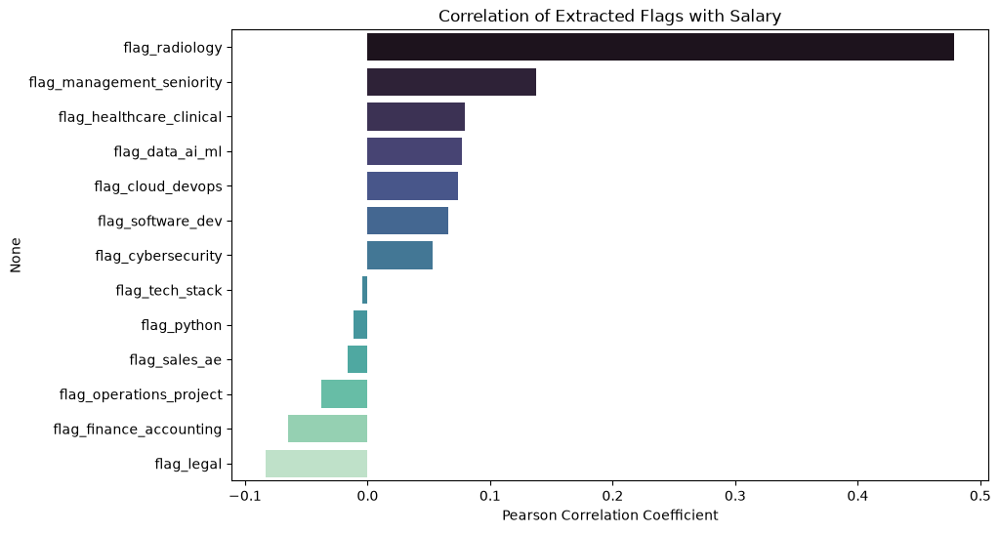

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# محاسبه همبستگی فلگ‌ها با حقوق
flag_cols = [col for col in df.columns if col.startswith('flag_')]
correlations = (
    df[flag_cols]
    .apply(lambda x: x.corr(df['Avg_Salary_USD_Annual']))
    .sort_values(ascending=False)
)

# رسم نمودار همبستگی
plt.figure(figsize=(10, 6))
sns.barplot(x=correlations.values, y=correlations.index, palette='mako')
plt.title('Correlation of Extracted Flags with Salary')
plt.xlabel('Pearson Correlation Coefficient')
plt.show()

In [42]:
premium_list = []
for col in flag_cols:
    median_with = df[df[col] == 1]['Avg_Salary_USD_Annual'].median()
    median_without = df[df[col] == 0]['Avg_Salary_USD_Annual'].median()
    diff = median_with - median_without
    count = df[col].sum()

    premium_list.append(
        {
            'Feature': col,
            'Job_Count': count,
            'Median_Salary_With': median_with,
            'Salary_Premium_USD': diff,
        }
    )

premium_df = pd.DataFrame(premium_list).sort_values(
        by='Salary_Premium_USD', ascending=False
    )
premium_df

,Feature,Job_Count,Median_Salary_With,Salary_Premium_USD
1,flag_radiology,300,525000.000,402500.000
9,flag_management_seniority,22005,135000.000,35000.000
8,flag_cybersecurity,1630,150000.000,27673.750
6,flag_cloud_devops,4328,144701.750,26351.750
3,flag_data_ai_ml,4174,145000.000,25000.000
4,flag_software_dev,5744,140000.000,20000.000
5,flag_tech_stack,1849,130000.000,7000.000
2,flag_python,489,124900.000,1377.500
7,flag_sales_ae,9478,122824.665,-1675.335
0,flag_healthcare_clinical,7798,121940.575,-3009.425


In [43]:
df3 = df
# محاسبه میانه حقوق کل بازار به عنوان خط پایه
overall_median = df3['Avg_Salary_USD_Annual'].median()

skill_stats = []
# فرض می‌کنیم ستون‌های فلگ شما با کلمه flag شروع می‌شوند
flag_cols = [col for col in df3.columns if col.startswith('flag_')]

for col in flag_cols:
    demand = df3[col].sum()
    if demand > 0:
        # محاسبه میانه حقوق فقط برای آگهی‌هایی که این مهارت را دارند
        skill_median = df3[df3[col] == 1]['Avg_Salary_USD_Annual'].median()
        premium = skill_median - overall_median # اختلاف حقوق با میانه کل
        
        # پاک کردن کلمه flag_ برای زیبایی نام در نمودار
        skill_name = col.replace('flag_', '').replace('_', ' ').title()
        skill_stats.append({'Skill': skill_name, 'Demand': demand, 'Salary_Premium': premium})

df3_skills = pd.DataFrame(skill_stats)
median_demand = df3_skills['Demand'].median()

# رسم نمودار پراکندگی (Scatter Plot)
fig16 = px.scatter(
    df3_skills.query("-50000 < Salary_Premium < 100000"), 
    x='Demand', 
    y='Salary_Premium', 
    size='Demand', # حباب‌های بزرگتر برای تقاضای بیشتر
    color='Salary_Premium',
    color_continuous_scale='RdYlGn',
    title='Skill Premium vs. Market Demand (The 4 Quadrants of Value)',
    labels={'Demand': 'Number of Job Postings', 'Salary_Premium': 'Salary Premium'},
    template='plotly_dark',
    hover_name='Skill'
)

# اضافه کردن خطوط متقاطع برای ساختن 4 ربع (Quadrants)
fig16.add_hline(y=0, line_dash="dash", line_color="red", annotation_text="Market Average Salary",)
fig16.add_vline(x=median_demand, line_dash="dash", line_color="blue", annotation_text="Median Demand",annotation_position='bottom')
fig16.update_traces(textposition='middle right')
fig16.update_layout( height=600, showlegend=False,)

df_filtered = df3_skills.query("-50000 < Salary_Premium < 100000")

custom_offsets = {
    'Data Ai Ml': {'ax': -25, 'ay': -20},      # شیفت به بالا و چپ
    'Cloud Devops': {'ax': 50, 'ay': 20},      # شیفت به پایین و راست
    'Healthcare Clinical': {'ax': -40, 'ay': 30}, # شیفت به پایین و چپ
    'Sales Ae': {'ax': 40, 'ay': -40},         # شیفت به بالا و راست
    'Legal': {'ax': 0, 'ay': -30},
    'Cybersecurity': {'ax': -25, 'ay': -20},
    'Cloud Devops': {'ax': -25, 'ay': 20},
    'Python': {'ax': -25, 'ay': -20},
    'Finance Accounting': {'ax': -25, 'ay': 20},
    'Tech Stack': {'ax': -25, 'ay': -20},
}

for i, row in df_filtered.iterrows():
    skill = row['Skill']
    
    # ۲. مقادیر پیش‌فرض برای اکثر نقاط
    ax_val = 30
    ay_val = -30
    
    # ۳. بررسی شرط: اگر نام مهارت در دیکشنری ما بود، مقادیر اختصاصی را جایگزین کن
    if skill in custom_offsets:
        ax_val = custom_offsets[skill]['ax']
        ay_val = custom_offsets[skill]['ay']
        
    fig16.add_annotation(
        x=row['Demand'],
        y=row['Salary_Premium'],
        text=skill,
        showarrow=True,
        arrowhead=1,
        arrowsize=1,
        arrowwidth=1,
        arrowcolor="gray",
        ax=ax_val,
        ay=ay_val,
        font=dict(size=10, color="white")
    )
    fig16.add_annotation(
    text="Size = Demand",  # متنی که می‌خواهید نمایش داده شود
    xref="paper",          # مبنای محور X را کل صفحه قرار می‌دهد
    yref="paper",          # مبنای محور Y را کل صفحه قرار می‌دهد
    x=0.98,                # موقعیت افقی (نزدیک به لبه سمت راست)
    y=0.02,                # موقعیت عمودی (نزدیک به لبه پایین)
    xanchor="right",       # نقطه لنگر متن سمت راست باشد
    yanchor="bottom",      # نقطه لنگر متن پایین باشد
    showarrow=False,       # بدون فلش
    font=dict(size=12, color="white"),
    bgcolor="rgba(30, 30, 30, 0.7)", # پس‌زمینه تیره و نیمه‌شفاف برای خوانایی بهتر
    bordercolor="gray",    # رنگ حاشیه باکس
    borderwidth=1,         # ضخامت حاشیه
    borderpad=5            # فاصله متن تا حاشیه باکس
)
fig16.show()

In [44]:
df_cat_exp = df.copy()
df_cat_exp['Category'] =  df_cat_exp['Category'].str.split(', ')
df_cat_exp = df_cat_exp.explode('Category').reset_index(drop=True)


In [45]:
df_cat_exp.Category.str = df_cat_exp.Category.str.strip()

In [46]:
df_cat_exp['Category'].value_counts()

Category
Software-Engineer               2270
Business-Development            1980
Account-Management              1726
B2B-Sales                       1653
Sales                           1613
                                ... 
Mechanical-Piping-Detailer         1
ISSO-Lead                          1
EV-Charging-Support                1
Virtual-Legal-Assistant            1
Legal-Administrative-Manager       1
Name: count, Length: 64606, dtype: int64

In [47]:
df_cat_exp_stats = (df_cat_exp.groupby(['Standard Category','Category'])['Avg_Salary_USD_Annual'].agg(['count','median', 'mean','sum'])).reset_index()
df_cat_exp_stats = df_cat_exp_stats.nlargest(40 ,'count')
df_cat_exp_stats = df_cat_exp_stats.sort_values(by='mean',ascending=False).head(40).reset_index(drop=True)
df_cat_exp_stats

,Standard Category,Category,count,median,mean,sum
0,Sales,Enterprise-Sales,536,157750.0000,177180.494249,9.496874e+07
1,Data & AI,Machine-Learning-Engineering,162,175000.0000,174910.458275,2.833549e+07
2,Software Development,Solutions-Architect,170,162793.0000,164501.664134,2.796528e+07
3,Software Development,Platform-Engineering,282,157140.0000,162568.610665,4.584435e+07
4,Software Development,Backend-Engineering,306,154100.0000,159962.785665,4.894861e+07
5,Healthcare,Clinical-Research,166,154950.0000,159242.270609,2.643422e+07
6,Sales,Sales-Engineering,161,151200.0000,156740.849419,2.523528e+07
7,Data & AI,Data-Engineering,230,146144.4825,153480.535187,3.530052e+07
8,Product,Product-Management,424,149075.0000,152767.442349,6.477340e+07
9,Software Development,Software-Engineer,684,145000.0000,150584.966443,1.030001e+08


In [48]:
px.treemap(
    df_cat_exp_stats,
    path=['Standard Category', 'Category'],
    values='count',
    color='median',
    color_continuous_scale='ylgn',
    title='Top 20 Job Roles by Posting counts',
    template='plotly_dark',
)

### 3_2. Insights:

## Insights & Analytical Findings

### 1. Demand vs. Compensation Dynamics
* **Healthcare Outperforms All Sectors:** Healthcare ranks highest in average annual compensation at **$156.5k** while maintaining the second-largest overall volume (**2,305 postings**).
* **Sales Drives Job Volume:** Sales is the largest sector by total demand with **2,610 postings** and offers a competitive average salary of **$132.7k**.
* **Tech & AI Premium:** Specialized technical domains command top-tier compensation:
  * **Data & AI:** $151.7k avg salary (1,104 postings)
  * **Engineering:** $151.2k avg salary (1,199 postings)
  * **Software Development:** $146.9k avg salary (1,616 postings)
  * **IT & Cybersecurity:** $139.3k avg salary (601 postings)
* **High-Volume Support Roles:** Customer Service maintains a strong presence with **1,056 postings**, but sits at the lower end of the compensation scale with an average salary of **$85.7k**.

---

### 2. Salary Budget Allocation & Top Enterprise Employers
* **Healthcare Heavyweights:** Salary budgets in Healthcare are heavily concentrated among massive players:
  * `radpartners-avature`: **$82,331,500**
  * `optimindhealth`: **$42,364,500**
  * `lifelancer`: **$28,795,256**
* **Cross-Sector Tech Investments:** 
  * `bright-vision-technologies` leads spending in Software Development (**$21.97M**), Engineering (**$8.97M**), and Data & AI (**$5.06M**).
  * `netflix` concentrates high-budget talent in Data & AI (**$5.34M**) and Software Development (**$5.22M**).
* **Sales & Enterprise Tech Spending:** 
  * `samsara` (**$7.48M**) and `lifelancer` (**$5.92M**) drive significant budget allocation within Sales.
  * `axiomlaw` (**$4.08M**) and `orion-placement` (**$4.05M**) represent the primary budget drivers in Legal.

---

### 3. Strategic Takeaways for Feature Engineering & Modeling
* **Healthcare & AI Flags as High-Value Drivers:** Binary indicators for Healthcare, Data/AI, and Engineering target the highest salary tiers ($150k+ median).
* **Sales Flag as Volume Driver:** Identifying Sales-related roles targets the largest cluster of job records in the dataset.
* **Employer Budget Scaling:** Including company identity flags (e.g., `radpartners`, `bright-vision-technologies`, `netflix`) provides significant predictive power due to extreme salary budget concentration.

### 3_3. Final CSV

In [49]:
df.columns

Index(['Title', 'Company Name', 'Company Slug', 'seniority', 'Employment Type',
       'Parent Categories', 'Category', 'Location Restrictions',
       'Salary Period', 'Currency', 'Published Date(STD)', 'Expiry Date(STD)',
       'Application Link', 'Excerpt', 'GUID', 'Standard Category',
       'Secondary Category', 'Region', 'Min_Salary_USD_Annual',
       'Max_Salary_USD_Annual', 'Avg_Salary_USD_Annual', 'Language',
       'Director', 'Entry-level', 'Executive', 'Manager', 'Mid-level',
       'Senior', 'Full Time', 'Intern', 'Other', 'Part Time', 'Temporary',
       'Volunteer', 'Geo_Restriction', 'seniority_rank', 'len_title',
       'len_exerpt', 'category_rank', 'currency_rank', 'region_rank',
       'language_rank', 'clean_location', 'location_rank', 'salary_level',
       'salary_range', 'salary_ratio', 'log_avg_salary',
       'listing_duration_days', 'compamu_posting_freq',
       'flag_healthcare_clinical', 'flag_radiology', 'flag_python',
       'flag_data_ai_ml', 'flag_so

In [50]:
df.to_csv('../3_data/final.csv')

## 🌍 The Hidden Realities of the Remote Job Market

While basic averages tell us *what* the market pays, a deeper analysis of geographical constraints, corporate budgets, and skill premiums reveals *how* that wealth is actually distributed. By Engineering specialized text-flags and visualizing the data, three hidden rules of the remote job market emerge:

### 1. The "Borderless" Illusion (Salary Geo-Arbitrage)
![Geo-Arbitrage Boxplot](path/to/image_e31108.png)
There is a common myth that remote work has created a flat, globalized salary standard. Our Geo-Arbitrage analysis shatters this illusion. Roles strictly tagged as **"US-Only"** command a significantly higher median salary and feature massive upper-quartile outliers. In contrast, positions open to **"Worldwide / No Restriction"** face a strict salary ceiling. 
**The Takeaway:** Employers leverage "Worldwide" tags for global salary arbitrage while reserving premium compensation budgets almost exclusively for localized talent.

### 2. The Oligopoly of Remote Hiring (Budget Pareto Distribution)
![Pareto Budget Chart](path/to/image_e3114a.jpg)
The remote job market is not an egalitarian space; it behaves like an oligopoly. Looking at the Top 40 companies by total salary budget, we observe a dramatic Pareto distribution. Just a handful of mega-firms (e.g., *RadPartners-Avature*, *LifeLancer*, *OptiMindHealth*) control a disproportionate share of the market's financial liquidity. 
**The Takeaway:** The top 40 companies alone account for roughly 25% of the total salary budget across the entire dataset. Understanding which enterprise giants hold the purse strings is crucial for a targeted job search.

### 3. The Niche vs. Volume Paradox & The "Python Baseline"
![Skill Premium Scatter Plot](path/to/image_e3dfc0.png)
When plotting a skill's market demand against its salary premium, a fascinating clustering occurs:
*   **The Universal Sweet Spot:** General **Management & Seniority** roles sit on the far right (maximum demand) while consistently maintaining a positive salary premium.
*   **The AI/Dev Equilibrium:** Interestingly, **Software Development** and **Data & AI** overlap almost perfectly, indicating a mature market equilibrium where advanced software engineering and machine learning roles are valued equally in terms of both demand and premium.
*   **The Python Baseline:** Foundational tech skills (like Python) cluster below the market average premium. This does not indicate weakness; rather, it shows **commoditization**. Python is the new baseline. To break into the premium tier, foundational coding must be combined with high-value niches like Cloud architecture, DevOps, or specialized Data Engineering.